### **1. Carregamentos**

In [1]:
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go

In [2]:
df = pd.read_csv('golden_run.csv')

### **2. Pré-processamento de dados**

In [3]:
df.shape

(9631, 372)

In [4]:
df.head()

,exp_id,Index,"chart=""apps.cpu"",family=""cpu"",dimension=""apps.plugin""","chart=""apps.cpu"",family=""cpu"",dimension=""cron""","chart=""apps.cpu"",family=""cpu"",dimension=""go.d.plugin""","chart=""apps.cpu"",family=""cpu"",dimension=""kernel""","chart=""apps.cpu"",family=""cpu"",dimension=""logs""","chart=""apps.cpu"",family=""cpu"",dimension=""netdata""","chart=""apps.cpu"",family=""cpu"",dimension=""other""","chart=""apps.cpu"",family=""cpu"",dimension=""ssh""",...,"chart=""users.pwrites"",family=""disk"",dimension=""root""","chart=""users.sockets"",family=""net"",dimension=""fields""","chart=""users.sockets"",family=""net"",dimension=""messagebus""","chart=""users.sockets"",family=""net"",dimension=""netdata""","chart=""users.sockets"",family=""net"",dimension=""root""","chart=""users.threads"",family=""processes"",dimension=""fields""","chart=""users.threads"",family=""processes"",dimension=""netdata""","chart=""users.threads"",family=""processes"",dimension=""root""","chart=""users.vmem"",family=""mem"",dimension=""fields""","chart=""users.vmem"",family=""mem"",dimension=""netdata"""
0,1,1,1.0032,0.0,0.0,1.0032,0.0,1.9949,2.6175,24.6291,...,36.036170,1.0,5.0,8.0,35.0,5.0,24.0,80.0,15.00000,964.3125
1,1,2,0.9941,0.0,0.0,1.0000,0.0,0.0000,3.9839,0.0000,...,11.977444,2.0,5.0,8.0,35.0,7.0,24.0,80.0,72.14062,964.3125
2,1,3,0.9990,0.0,0.0,2.9922,0.0,0.9977,92.0409,0.0000,...,3.988951,2.0,5.0,8.0,35.0,7.0,24.0,80.0,72.58203,964.3125
3,1,4,1.0018,0.0,0.0,0.0000,0.0,0.9982,92.7466,0.0000,...,3.999612,2.0,5.0,8.0,35.0,7.0,24.0,80.0,72.58203,964.3125
4,1,5,0.9981,0.0,0.0,1.0027,0.0,0.9999,92.2550,0.0000,...,4.000132,2.0,5.0,8.0,35.0,7.0,24.0,80.0,72.58203,964.3125


In [5]:
df.dtypes.head(10)

exp_id                                                     int64
Index                                                      int64
chart="apps.cpu",family="cpu",dimension="apps.plugin"    float64
chart="apps.cpu",family="cpu",dimension="cron"           float64
chart="apps.cpu",family="cpu",dimension="go.d.plugin"    float64
chart="apps.cpu",family="cpu",dimension="kernel"         float64
chart="apps.cpu",family="cpu",dimension="logs"           float64
chart="apps.cpu",family="cpu",dimension="netdata"        float64
chart="apps.cpu",family="cpu",dimension="other"          float64
chart="apps.cpu",family="cpu",dimension="ssh"            float64
dtype: object

In [6]:
df.nunique().sort_values().values

array([   1,    1,    1,    1,    1,    1,    1,    1,    1,    1,    1,
          1,    1,    1,    1,    1,    1,    2,    2,    2,    2,    2,
          2,    2,    2,    2,    2,    2,    2,    2,    2,    2,    2,
          2,    3,    3,    3,    3,    3,    3,    3,    3,    3,    3,
          3,    3,    3,    3,    4,    4,    4,    4,    4,    4,    4,
          4,    4,    4,    4,    4,    5,    5,    5,    5,    5,    5,
          5,    5,    5,    5,    5,    5,    5,    5,    5,    5,    6,
          6,    6,    6,    7,    7,    7,    7,    8,    8,    8,    8,
          8,    8,    8,    8,    9,    9,    9,    9,   10,   10,   11,
         11,   11,   11,   12,   12,   12,   12,   12,   13,   13,   13,
         14,   14,   14,   15,   15,   15,   15,   15,   16,   16,   16,
         16,   17,   17,   17,   17,   17,   17,   17,   17,   17,   18,
         18,   18,   18,   18,   18,   18,   20,   20,   22,   23,   23,
         23,   23,   23,   24,   24,   24,   26,   

In [7]:
df1 = df.loc[:, df.nunique() != 1]

In [8]:
df1 = df1.drop(['exp_id','Index'], axis=1)

In [9]:
base_all = df1.dropna()

In [10]:
base_all.shape
# sem valores nulos

(9631, 353)

In [11]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(base_all)
base_all_scaled = scaler.transform(base_all)

In [12]:
base_all_scaled = pd.DataFrame(base_all_scaled, columns = base_all.columns, index=base_all.index)

In [13]:
base_all_scaled.head()

,"chart=""apps.cpu"",family=""cpu"",dimension=""apps.plugin""","chart=""apps.cpu"",family=""cpu"",dimension=""cron""","chart=""apps.cpu"",family=""cpu"",dimension=""go.d.plugin""","chart=""apps.cpu"",family=""cpu"",dimension=""kernel""","chart=""apps.cpu"",family=""cpu"",dimension=""logs""","chart=""apps.cpu"",family=""cpu"",dimension=""netdata""","chart=""apps.cpu"",family=""cpu"",dimension=""other""","chart=""apps.cpu"",family=""cpu"",dimension=""ssh""","chart=""apps.cpu"",family=""cpu"",dimension=""system""","chart=""apps.cpu"",family=""cpu"",dimension=""tc-qos-helper""",...,"chart=""users.pwrites"",family=""disk"",dimension=""root""","chart=""users.sockets"",family=""net"",dimension=""fields""","chart=""users.sockets"",family=""net"",dimension=""messagebus""","chart=""users.sockets"",family=""net"",dimension=""netdata""","chart=""users.sockets"",family=""net"",dimension=""root""","chart=""users.threads"",family=""processes"",dimension=""fields""","chart=""users.threads"",family=""processes"",dimension=""netdata""","chart=""users.threads"",family=""processes"",dimension=""root""","chart=""users.vmem"",family=""mem"",dimension=""fields""","chart=""users.vmem"",family=""mem"",dimension=""netdata"""
0,0.006884,-0.039891,-0.178639,0.123063,-0.041375,1.549708,-9.749290,7.778516,-0.042309,-0.316326,...,2.571297,-9.131316,-0.01019,-0.350557,-7.027861,-6.514635,0.089293,1.182661,-9.490449,-0.493475
1,-0.008489,-0.039891,-0.178639,0.119083,-0.041375,-1.490891,-9.597548,-0.382528,-0.042309,-0.316326,...,0.406890,-6.821294,-0.01019,-0.350557,-7.027861,-3.963092,0.089293,1.182661,-2.333729,-0.493475
2,-0.000211,-0.039891,-0.178639,2.596980,-0.041375,0.029790,0.181355,-0.382528,-0.042309,-0.316326,...,-0.311783,-6.821294,-0.01019,-0.350557,-7.027861,-3.963092,0.089293,1.182661,-2.278444,-0.493475
3,0.004519,-0.039891,-0.178639,-1.124716,-0.041375,0.030552,0.259724,-0.382528,-0.042309,3.128638,...,-0.310824,-6.821294,-0.01019,-0.350557,-7.027861,-3.963092,0.089293,1.182661,-2.278444,-0.493475
4,-0.001731,-0.039891,-0.178639,0.122441,-0.041375,0.033143,0.205131,-0.382528,-0.042309,-0.316326,...,-0.310777,-6.821294,-0.01019,-0.350557,-7.027861,-3.963092,0.089293,1.182661,-2.278444,-0.493475


### **3. Análise Base Geral**

### 3.1. Primeiras infos PCA

In [14]:
from sklearn.decomposition import PCA

In [15]:
# Inicialize o modelo PCA com o número de componentes desejado (por exemplo, 2 componentes)
pca = PCA(n_components=len(base_all_scaled.columns))
pca.fit_transform(base_all_scaled)

array([[ 7.66563581e+01,  2.62083118e+01, -1.50550698e+01, ...,
         2.39880928e-14, -1.03361786e-15, -9.65733645e-17],
       [ 4.27402074e+01,  9.10098646e+00, -4.23086327e+00, ...,
         6.86918129e-16, -6.33156949e-15, -1.13769622e-15],
       [ 2.87339759e+01,  1.04415168e+00, -9.59037518e-01, ...,
         1.32166492e-15,  3.16683843e-15, -1.85393117e-16],
       ...,
       [-5.38520938e+00,  7.54451002e+00, -3.19183261e+00, ...,
         6.27859877e-17,  5.62990809e-17, -2.06722974e-17],
       [ 1.58549209e+01,  1.76835552e+01, -1.14346513e+01, ...,
         2.00580616e-16,  1.72618925e-16,  1.38976262e-17],
       [ 2.00435963e+01,  1.94678446e+01, -1.13232431e+01, ...,
        -2.31891963e-16, -2.64018073e-16, -1.53795206e-17]])

In [16]:
# Identificação das N variáveis mais relevantes
n_top_features = 50
top_50_components = pca.components_[:n_top_features]
base_top_features = pca.transform(base_all_scaled)[:, :n_top_features]

# Transformação do DataFrame original com os 50 componentes mais relevantes
base_top_features = pd.DataFrame(base_top_features, columns=[f'componente_{i+1}' for i in range(n_top_features)])

In [17]:
base_top_features

,componente_1,componente_2,componente_3,componente_4,componente_5,componente_6,componente_7,componente_8,componente_9,componente_10,...,componente_41,componente_42,componente_43,componente_44,componente_45,componente_46,componente_47,componente_48,componente_49,componente_50
0,76.656358,26.208312,-15.055070,8.781035,2.049581,10.083827,1.817178,-23.746358,-4.050612,0.334744,...,-2.737559,-1.563066,-2.608358,1.331216,-5.468643,-1.921419,-1.108499,0.484441,4.143493,-0.854658
1,42.740207,9.100986,-4.230863,32.812409,-16.645529,-9.084751,-5.139087,0.961977,-1.594451,10.127388,...,-0.093201,0.435562,-0.639299,-0.197827,1.528047,-1.577443,-0.021465,0.685774,1.176074,-2.014261
2,28.733976,1.044152,-0.959038,26.659580,-11.566254,-18.085064,-26.628991,-4.000312,-1.570870,32.913157,...,12.244358,6.120143,9.754623,-4.162896,20.125809,-9.790762,3.149110,-0.890676,2.746557,-3.614288
3,19.048537,-4.209523,-4.415785,12.045644,-3.799947,-6.079996,-10.941964,3.248705,0.813252,16.547205,...,3.090380,-2.475804,-1.026708,0.370420,-2.179902,0.629229,-0.706542,-0.267170,0.819006,1.042912
4,19.607869,-3.832612,-4.474316,9.831891,-5.426591,-5.507113,-10.457857,3.163636,0.853256,16.024352,...,-0.149207,-0.541027,-0.252152,0.589000,-2.479284,1.230849,-0.770160,-0.245315,0.108594,1.532689
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9626,-5.045050,7.681923,-3.187722,0.125276,-2.197082,2.873333,-1.495325,-1.565994,-0.551220,0.058738,...,0.141278,-0.287722,-0.308233,1.183093,0.814952,1.288745,0.411173,0.854797,0.559373,-0.296320
9627,-4.980373,7.820012,-3.493734,0.943078,-2.005339,2.923505,-0.940929,-1.040103,-0.515745,-0.569299,...,0.246876,0.831561,-0.557420,-1.349996,0.566116,-0.741378,-1.249671,-0.877044,-1.407775,0.219568
9628,-5.385209,7.544510,-3.191833,0.663662,-2.303168,2.679119,-1.344711,-1.273791,-0.485061,-0.372160,...,-0.571915,0.872377,-0.131467,0.813415,0.822963,0.224260,-0.797120,-0.715589,-0.267822,-0.136913
9629,15.854921,17.683555,-11.434651,21.681454,-18.266211,5.311085,17.202582,2.006423,-2.463118,-19.273082,...,-7.498140,-2.553264,-5.229209,1.804424,-12.168378,5.336223,-4.071590,-0.221615,1.264479,4.361348


In [18]:
# Excel
pd.DataFrame(base_top_features).to_excel('top_golden_features.xlsx', index=False)

### 3.2. Scree plot

In [19]:
# Obtenha as proporções de variância explicada
explained_variance = pca.explained_variance_ratio_

# Obtenha os autovalores
eigenvalues = pca.explained_variance_

print("Variância explicada")
print(explained_variance)

print("\nAutovalores")
print(eigenvalues)

Variância explicada
[1.24725313e-01 1.12009232e-01 6.34178615e-02 4.79414784e-02
 4.45836407e-02 2.97632283e-02 2.44358499e-02 2.34731533e-02
 2.28629560e-02 2.09653893e-02 1.95949797e-02 1.85467637e-02
 1.64829598e-02 1.53723134e-02 1.46701830e-02 1.25888379e-02
 1.23783017e-02 1.18475704e-02 1.11042899e-02 1.04563172e-02
 1.03311083e-02 9.97918726e-03 9.40173224e-03 9.10607840e-03
 8.84322769e-03 8.58767181e-03 8.30918052e-03 8.05123005e-03
 7.88992742e-03 7.73162907e-03 7.26927932e-03 7.13772341e-03
 6.85912061e-03 6.48454552e-03 6.46626392e-03 6.29389503e-03
 6.03543818e-03 5.86733576e-03 5.59364730e-03 5.52516490e-03
 5.47680103e-03 5.47360157e-03 5.40779722e-03 5.30493048e-03
 5.20489292e-03 5.02354439e-03 4.69853753e-03 4.58808880e-03
 4.28767761e-03 4.18753371e-03 4.04074433e-03 3.98487382e-03
 3.79879031e-03 3.61400254e-03 3.41047679e-03 3.36086473e-03
 3.24372078e-03 3.14661099e-03 3.06915974e-03 3.02101766e-03
 2.99867961e-03 2.93767099e-03 2.92359490e-03 2.89797115e-03
 2.8

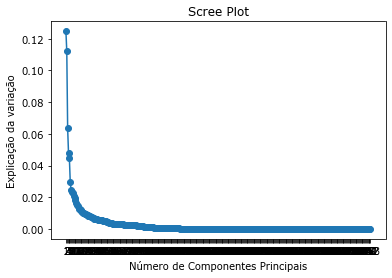

In [20]:
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='-')
plt.xticks(np.arange(1, len(explained_variance) + 1, step=1))
plt.xlabel('Número de Componentes Principais')
plt.ylabel('Explicação da variação')
plt.title('Scree Plot')

plt.show()

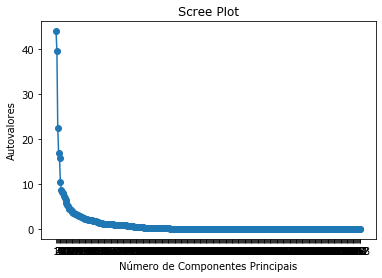

In [21]:
plt.plot(range(1, len(explained_variance) + 1), eigenvalues, marker='o', linestyle='-')
plt.xticks(np.arange(1, len(explained_variance) + 1, step=1))
plt.xlabel('Número de Componentes Principais')
plt.ylabel('Autovalores')
plt.title('Scree Plot')

plt.show()

#### Este segundo é o scree plot em si, pois no eixo Y são representados os autovalores.

### 3.3. Loadings (Variáveis que mais contribuem para os 2 componentes)

In [22]:
# Obtenha os autovetores (vetores próprios)
eigenvectors = pca.components_

# Crie um DataFrame para visualizar os autovetores com os nomes das variáveis originais
eigenvectors_df = pd.DataFrame(eigenvectors, columns=base_all_scaled.columns)

# Agora, para cada componente principal, você pode ver como as variáveis originais contribuem para ele.
# Por exemplo, para o primeiro componente principal:
component_1 = eigenvectors_df.iloc[0]
component_2 = eigenvectors_df.iloc[1]

### Resumo dos Loadings

In [23]:
# Trabalhando com apenas 2 componentes
pca = PCA(n_components=2)
pca.fit(base_all_scaled)
base_all_pca = pca.transform(base_all_scaled)

In [24]:
loadings = pd.DataFrame(pca.components_.T, columns=['PC1','PC2'], index=base_all_scaled.columns)
round(loadings,3)

,PC1,PC2
"chart=""apps.cpu"",family=""cpu"",dimension=""apps.plugin""",-0.002,0.005
"chart=""apps.cpu"",family=""cpu"",dimension=""cron""",-0.002,0.015
"chart=""apps.cpu"",family=""cpu"",dimension=""go.d.plugin""",0.000,0.002
"chart=""apps.cpu"",family=""cpu"",dimension=""kernel""",0.013,0.011
"chart=""apps.cpu"",family=""cpu"",dimension=""logs""",0.008,0.024
...,...,...
"chart=""users.threads"",family=""processes"",dimension=""fields""",-0.092,-0.044
"chart=""users.threads"",family=""processes"",dimension=""netdata""",-0.050,0.098
"chart=""users.threads"",family=""processes"",dimension=""root""",0.027,0.063
"chart=""users.vmem"",family=""mem"",dimension=""fields""",-0.100,-0.051


#### Abaixo, a participação de uma variável em relação às duas! Aqui não é o tamanho do impacto, mas como cada uma delas impacta nas componentes. Por exemplo, loan_id impacta muito mais em PC2 apesar do absoluto dessa var ser quase zero (tabela acima).

In [25]:
norm_loadings = loadings.div(loadings.sum(axis=1), axis=0)
round(norm_loadings,3)

,PC1,PC2
"chart=""apps.cpu"",family=""cpu"",dimension=""apps.plugin""",-0.546,1.546
"chart=""apps.cpu"",family=""cpu"",dimension=""cron""",-0.136,1.136
"chart=""apps.cpu"",family=""cpu"",dimension=""go.d.plugin""",0.174,0.826
"chart=""apps.cpu"",family=""cpu"",dimension=""kernel""",0.540,0.460
"chart=""apps.cpu"",family=""cpu"",dimension=""logs""",0.255,0.745
...,...,...
"chart=""users.threads"",family=""processes"",dimension=""fields""",0.677,0.323
"chart=""users.threads"",family=""processes"",dimension=""netdata""",-1.045,2.045
"chart=""users.threads"",family=""processes"",dimension=""root""",0.304,0.696
"chart=""users.vmem"",family=""mem"",dimension=""fields""",0.660,0.340


### 3.4. Loading plot

In [ ]:
def loading_plot(coeff, labels):
    n = coeff.shape[0]
    for i in range(n):
        plt.arrow(0, 0, coeff[i,0], coeff[i,1], head_width = 0.05, head_length = 0.05, color = 'red',alpha = 0.5)
        plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, labels[i], color = 'blue', ha = 'center', va = 'center')
    plt.xlim(-1,1)
    plt.ylim(-1,1)
    plt.xlabel('PC1')
    plt.ylabel('PC2')
    plt.grid()

fig, ax = plt.subplots(figsize = (7,7))
plt.title('Loading Plot')
loading_plot(pca.components_.T, base_all_scaled.columns)

#### Percebe-se que as duas variáveis principais que melhor explicam cada componente estão altamente correlacionadas. De um lado, "goods_valuation" com "credit_amount" e, de outro, "past_avg_amt_credit" com "past_avg_amt_application".

#### Além disso, cada um desses pares não se relacionam entre si (cos~0º)...

#### Annual income tem força menor, mas é a 5ªa variável, pois é a 5ª a explicar PC1 e 3ª de PCA. Possui correlação positiva média com as quatro variáveis principais.

### 3.5. Score plot

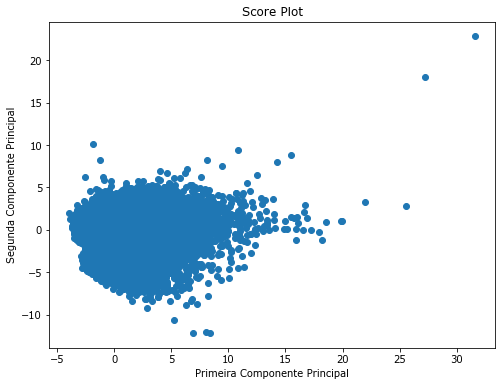

In [47]:
plt.figure(figsize=(8,6))
plt.scatter(base_all_pca[:, 0], base_all_pca[:, 1])
plt.xlabel('Primeira Componente Principal')
plt.ylabel('Segunda Componente Principal')
plt.title('Score Plot')

plt.show()

#### O score plot mostra que não existe nenhuma relação óbvia entre as duas componentes senão uma relação de perpendicularidade entre ambas.
#### Não existe grandes clusteres bem separados também.
#### Poucos são os pontos de outlier, sendo os principais aqueles que se encontram em X>3 e Y<2 (menos de 1 dúzia de ponto).

### 3.6. Análise de resíduos

In [48]:
reconstructed_matrix = pca.inverse_transform(base_all_pca)

In [49]:
e = base_all_scaled - reconstructed_matrix

##### Análise por linha

In [50]:
distance_point = np.sum(e**2, axis=1)

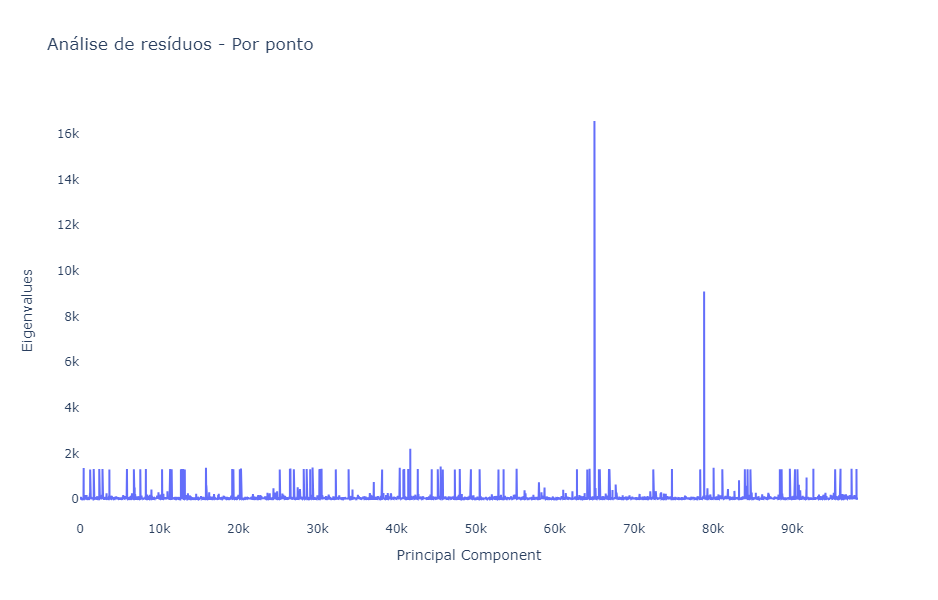

In [51]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=list(range(1,distance_point.shape[0]+1)), y=distance_point, mode='lines'))

fig.update_layout(plot_bgcolor='rgba(0,0,0,0)')

fig.update_layout(
    title='Análise de resíduos - Por ponto',
    xaxis=dict(title='Principal Component', showgrid=True),
    yaxis=dict(title='Eigenvalues', showgrid=True),
    width=800, 
    height=600)

fig.show()

##### Análise por coluna

In [52]:
variance_col_original = np.var(base_all_scaled, axis=0)
variance_col_reconstructed = np.var(reconstructed_matrix, axis=0)

In [53]:
var_explained_feature = variance_col_reconstructed/variance_col_original

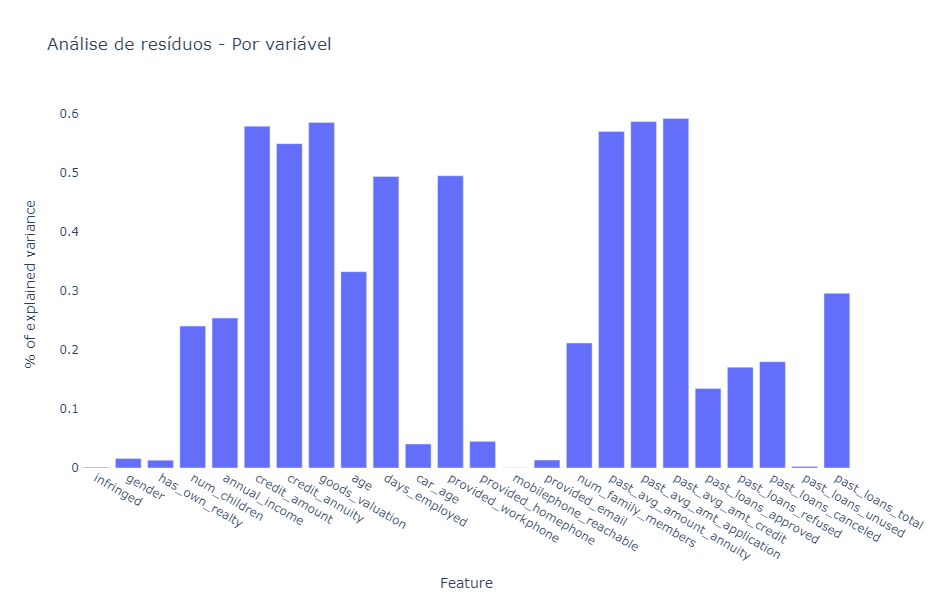

In [54]:
fig = go.Figure()

fig.add_trace(go.Bar(x=var_explained_feature.index, y=var_explained_feature))

fig.update_layout(plot_bgcolor='rgba(0,0,0,0)')

fig.update_layout(
    title='Análise de resíduos - Por variável',
    xaxis=dict(title='Feature', showgrid=True),
    yaxis=dict(title='% of explained variance', showgrid=True),
    width=800, 
    height=600)

fig.show()

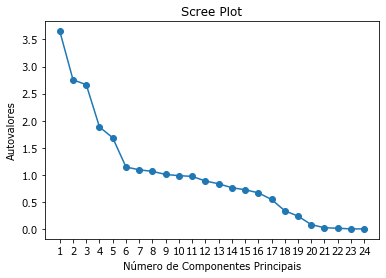

In [55]:
### Retoando o Scree Plot
plt.plot(range(1, len(explained_variance) + 1), eigenvalues, marker='o', linestyle='-')
plt.xticks(np.arange(1, len(explained_variance) + 1, step=1))
plt.xlabel('Número de Componentes Principais')
plt.ylabel('Autovalores')
plt.title('Scree Plot')

plt.show()

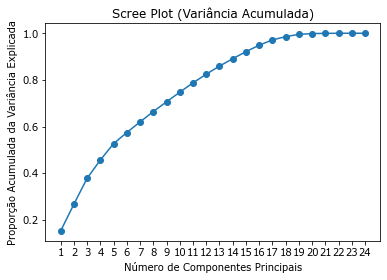

In [56]:
# Calcule os autovalores acumulados
cumulative_eigenvalues = np.cumsum(eigenvalues)

# Calcule a proporção acumulada da variância explicada
explained_variance_ratio = cumulative_eigenvalues / np.sum(eigenvalues)

# Crie o gráfico de Scree Plot com autovalores acumulados
plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, marker='o', linestyle='-')
plt.xticks(np.arange(1, len(explained_variance_ratio) + 1, step=1))
plt.xlabel('Número de Componentes Principais')
plt.ylabel('Proporção Acumulada da Variância Explicada')
plt.title('Scree Plot (Variância Acumulada)')

plt.show()

#### Reforça-se que com 10 componente se explica 75% da variação total de X.

In [57]:
# Criando os pontos no novo plano
scores = np.array([base_all_pca[:, 0], base_all_pca[:, 1]])

# Número total de pontos
total_points = scores.shape[1]

# Trabalhando com apenas 1% dos dados, porque são muitos
num_points_to_select = total_points // 100

# Gerando índices aleatórios para selecionar os pontos
random_indices = np.random.choice(total_points, size=num_points_to_select, replace=False)

# Selecione os pontos correspondentes aos índices gerados aleatoriamente
selected_scores = scores[:, random_indices]

In [58]:
#from scipy.spatial.distance import cdist

# Calculando o centroide
#centroid = np.mean(selected_scores, axis=0)

# Calculando as distâncias de cada ponto ao centroide
#distancias_mahalanobis = cdist(selected_scores, centroid.reshape(1, -1), 'mahalanobis', VI=np.linalg.inv(np.cov(selected_scores)))

In [59]:
#from scipy.spatial import distance

# Calcule as distâncias Mahalanobis dos pontos de dados aos centroides
#centroid = np.mean(selected_scores, axis=0)
#DModX = [distance.mahalanobis(point, centroid, np.cov(selected_scores.T)) for point in selected_scores]

# Plote o gráfico DModX
#plt.scatter(range(len(DModX)), DModX, c='b', label='DModX', marker='o')
#plt.xlabel('Observações')
#plt.ylabel('Distância Mahalanobis')
#plt.legend()
#plt.title('Gráfico DModX')
#plt.show()

In [60]:
#distancias_mahalanobis = [2.5, 1.8, 3.2, 0.7, 4.0]  # Substitua pelos seus próprios valores

# Defina um limiar de detecção (opcional)
#limiar = 2.0

# Crie um gráfico de barras das distâncias Mahalanobis
#plt.bar(range(len(distancias_mahalanobis)), distancias_mahalanobis, color='b', label='Distâncias Mahalanobis')
#plt.axhline(y=limiar, color='r', linestyle='--', label='Limiar de Detecção')
#plt.xlabel('Observações')
#plt.ylabel('Distâncias Mahalanobis')
#plt.legend()
#plt.title('Gráfico DModX (Barras)')
#plt.show()

### **4. Análise Base Homens - Base Mulheres**

In [61]:
print(f"Male data shape: {base_m.shape}\nFemale data shape: {base_f.shape}")

Male data shape: (55693, 23)
Female data shape: (42643, 23)


### 4.1. Primeiras infos PCA

In [62]:
import plotly.graph_objects as go

In [63]:
# Inicialize o modelo PCA com o número de componentes desejado (por exemplo, 2 componentes)
pca_man = PCA(n_components=len(base_m.columns))
pca_woman = PCA(n_components=len(base_m.columns))
pca_man.fit_transform(base_m)
pca_woman.fit_transform(base_f)

pcs = np.array(range(1,27))

### 4.2. Scree plot

Coloquei vários tipos de gráficos para depois vermos qual preferimos colocar na apresentação

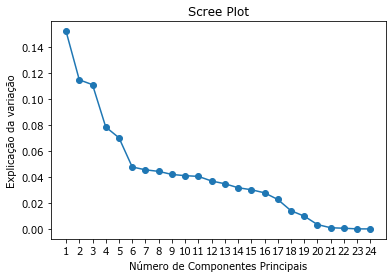

In [64]:
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='-')
plt.xticks(np.arange(1, len(explained_variance) + 1, step=1))
plt.xlabel('Número de Componentes Principais')
plt.ylabel('Explicação da variação')
plt.title('Scree Plot')

plt.show()

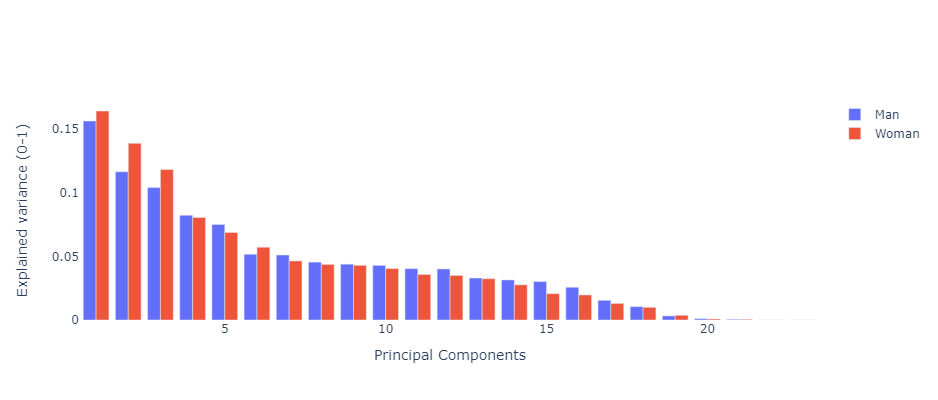

In [65]:
# Obtenha as proporções de variância explicada
explained_variance_man = pca_man.explained_variance_ratio_
explained_variance_woman = pca_woman.explained_variance_ratio_

# Obtenha os autovalores
eigenvalues_man = pca_man.explained_variance_
eigenvalues_woman = pca_woman.explained_variance_

fig = go.Figure(data=[
    go.Bar(name='Man', x=pcs, y=explained_variance_man),
    go.Bar(name='Woman', x=pcs, y=explained_variance_woman)
])
# Change the bar mode
fig.update_layout(barmode='group',
                  plot_bgcolor='white',  
                  xaxis=dict(title='Principal Components'),
                  yaxis=dict(title='Explained variance (0-1)'),
                  width=600, 
                  height=400)
fig.show()

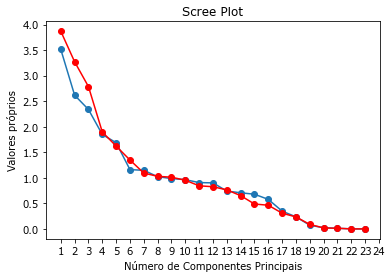

In [66]:
plt.plot(range(1, len(explained_variance_man) + 1), eigenvalues_man, marker='o', linestyle='-')
plt.plot(range(1, len(explained_variance_man) + 1), eigenvalues_woman, marker='o', linestyle='-', color='r')
plt.xticks(np.arange(1, len(explained_variance) + 1, step=1))
plt.xlabel('Número de Componentes Principais')
plt.ylabel('Valores próprios')
plt.title('Scree Plot')

plt.show()

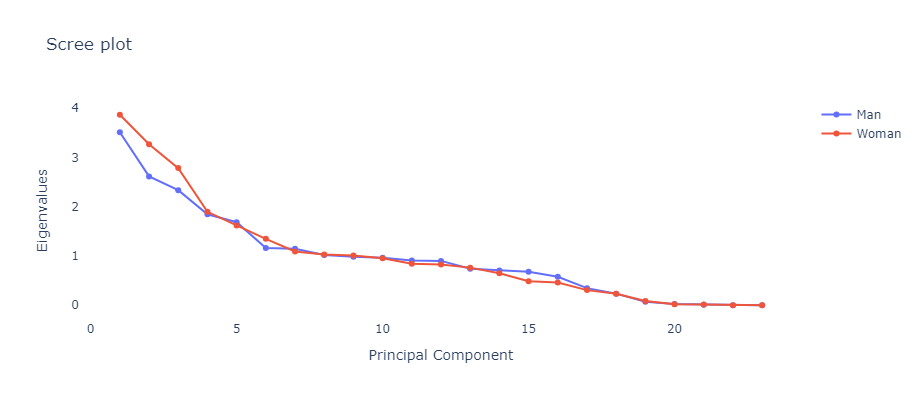

In [67]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=pcs, y=eigenvalues_man, mode='lines+markers', name='Man'))

fig.add_trace(go.Scatter(x=pcs, y=eigenvalues_woman, mode='lines+markers', name='Woman'))

fig.update_layout(plot_bgcolor='rgba(0,0,0,0)')

fig.update_layout(
    title='Scree plot',
    xaxis=dict(title='Principal Component', showgrid=True),
    yaxis=dict(title='Eigenvalues', showgrid=True),
    width=600, 
    height=400)

fig.show()

### 4.1. Loadings

In [68]:
eigenvectors_man = pca_man.components_
eigenvectors_woman = pca_woman.components_

eigenvectors_df_man = pd.DataFrame(eigenvectors_man, columns=base_m.columns)
eigenvectors_df_woman = pd.DataFrame(eigenvectors_woman, columns=base_f.columns)

# Agora, para cada componente principal, você pode ver como as variáveis originais contribuem para ele.
# Por exemplo, para o primeiro componente principal:
component_1_man = eigenvectors_df_man.iloc[0]
component_2_man = eigenvectors_df_man.iloc[1]

component_1_woman = eigenvectors_df_woman.iloc[0]
component_2_woman = eigenvectors_df_woman.iloc[1]

In [69]:
print("Contribuição das variáveis para o primeiro componente principal nos homens:")
print(component_1_man.sort_values(ascending=False))

Contribuição das variáveis para o primeiro componente principal nos homens:
past_avg_amt_credit         0.406807
past_avg_amt_application    0.406519
past_avg_amount_annuity     0.398857
goods_valuation             0.334381
credit_amount               0.332763
credit_annuity              0.327107
annual_income               0.273852
past_loans_total            0.171531
past_loans_canceled         0.144112
past_loans_refused          0.122397
age                         0.117657
past_loans_approved         0.115128
provided_email              0.055409
num_family_members          0.020051
has_own_realty              0.017138
days_employed               0.006861
mobilephone_reachable       0.000289
provided_workphone         -0.007991
num_children               -0.010568
past_loans_unused          -0.017753
infringed                  -0.019853
provided_homephone         -0.026263
car_age                    -0.089273
Name: 0, dtype: float64


In [70]:
print("Contribuição das variáveis para o primeiro componente principal nas mulheres:")
print(component_1_woman.sort_values(ascending=False))

Contribuição das variáveis para o primeiro componente principal nas mulheres:
past_avg_amt_credit         0.377042
past_avg_amt_application    0.374904
past_avg_amount_annuity     0.372524
goods_valuation             0.322412
credit_amount               0.319937
credit_annuity              0.300501
past_loans_total            0.203724
age                         0.203649
annual_income               0.186557
past_loans_canceled         0.158934
past_loans_refused          0.152372
past_loans_approved         0.144539
days_employed               0.143612
provided_email              0.052827
has_own_realty              0.018658
mobilephone_reachable      -0.006482
infringed                  -0.016087
past_loans_unused          -0.034885
provided_homephone         -0.051065
car_age                    -0.103427
num_family_members         -0.119800
num_children               -0.144355
provided_workphone         -0.144836
Name: 0, dtype: float64


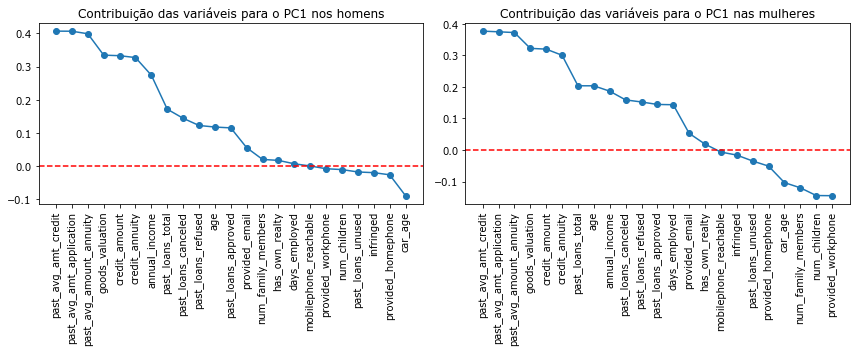

In [71]:
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

axs[0].set_title('Contribuição das variáveis para o PC1 nos homens')
axs[0].plot(component_1_man.sort_values(ascending=False), marker='o', linestyle='-')
axs[0].axhline(y=0, color='red', linestyle='--')
axs[0].tick_params(axis='x', rotation=90)

axs[1].set_title('Contribuição das variáveis para o PC1 nas mulheres')
axs[1].plot(component_1_woman.sort_values(ascending=False), marker='o', linestyle='-')
axs[1].axhline(y=0, color='red', linestyle='--')
axs[1].tick_params(axis='x', rotation=90)

plt.tight_layout()

plt.show()

In [72]:
print("Contribuição das variáveis para a segunda componente principal nos homens:")
print(component_2_man.sort_values(ascending=False))

Contribuição das variáveis para a segunda componente principal nos homens:
past_loans_total            0.501377
past_loans_canceled         0.402874
past_loans_refused          0.340315
past_loans_approved         0.339725
past_avg_amt_credit         0.106714
past_avg_amount_annuity     0.093836
past_avg_amt_application    0.093565
past_loans_unused           0.092428
provided_email              0.059168
infringed                   0.055815
has_own_realty              0.042850
car_age                     0.008978
provided_workphone          0.005114
mobilephone_reachable      -0.002810
days_employed              -0.004541
provided_homephone         -0.032331
num_children               -0.035008
age                        -0.042269
num_family_members         -0.045669
annual_income              -0.112258
credit_annuity             -0.278849
goods_valuation            -0.325851
credit_amount              -0.326079
Name: 1, dtype: float64


In [73]:
print("Contribuição das variáveis para a segunda componente principal nas mulheres:")
print(component_2_woman.sort_values(ascending=False))

Contribuição das variáveis para a segunda componente principal nas mulheres:
provided_workphone          0.539062
num_children                0.250558
num_family_members          0.245734
credit_annuity              0.196252
goods_valuation             0.183194
credit_amount               0.182520
provided_homephone          0.125642
annual_income               0.115916
past_avg_amount_annuity     0.102336
past_avg_amt_credit         0.086611
past_avg_amt_application    0.085596
provided_email              0.067862
infringed                   0.018705
past_loans_unused           0.017082
mobilephone_reachable       0.002669
past_loans_canceled        -0.001152
past_loans_approved        -0.016520
past_loans_total           -0.019388
past_loans_refused         -0.030176
has_own_realty             -0.040430
car_age                    -0.068564
age                        -0.350090
days_employed              -0.539094
Name: 1, dtype: float64


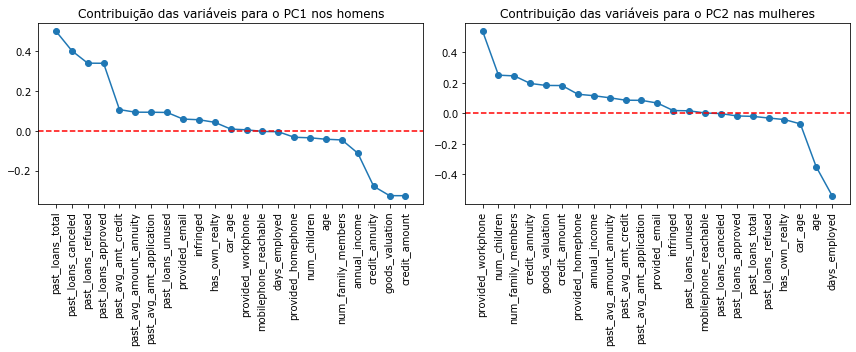

In [74]:
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

axs[0].set_title('Contribuição das variáveis para o PC1 nos homens')
axs[0].plot(component_2_man.sort_values(ascending=False), marker='o', linestyle='-')
axs[0].axhline(y=0, color='red', linestyle='--')
axs[0].tick_params(axis='x', rotation=90)

axs[1].set_title('Contribuição das variáveis para o PC2 nas mulheres')
axs[1].plot(component_2_woman.sort_values(ascending=False), marker='o', linestyle='-')
axs[1].axhline(y=0, color='red', linestyle='--')
axs[1].tick_params(axis='x', rotation=90)

plt.tight_layout()

plt.show()

### Resumo dos Loadings

In [75]:
pca_m = PCA(n_components=2)
pca_m.fit(base_m)
base_all_pca_man = pca_m.transform(base_m)

pca_f = PCA(n_components=2)
pca_f.fit(base_f)
base_all_pca_woman = pca_f.transform(base_f)

In [76]:
loadings = pd.DataFrame(pca_m.components_.T, columns=['PC1','PC2'], index=base_m.columns)
round(loadings,3)

,PC1,PC2
infringed,-0.020,0.056
has_own_realty,0.017,0.043
num_children,-0.011,-0.035
annual_income,0.274,-0.112
credit_amount,0.333,-0.326
credit_annuity,0.327,-0.279
goods_valuation,0.334,-0.326
age,0.118,-0.042
days_employed,0.007,-0.005
car_age,-0.089,0.009


In [77]:
loadings = pd.DataFrame(pca_f.components_.T, columns=['PC1','PC2'], index=base_m.columns)
round(loadings,3)

,PC1,PC2
infringed,-0.016,0.019
has_own_realty,0.019,-0.040
num_children,-0.144,0.251
annual_income,0.187,0.116
credit_amount,0.320,0.183
credit_annuity,0.301,0.196
goods_valuation,0.322,0.183
age,0.204,-0.350
days_employed,0.144,-0.539
car_age,-0.103,-0.069


### 4.4. Loading plot

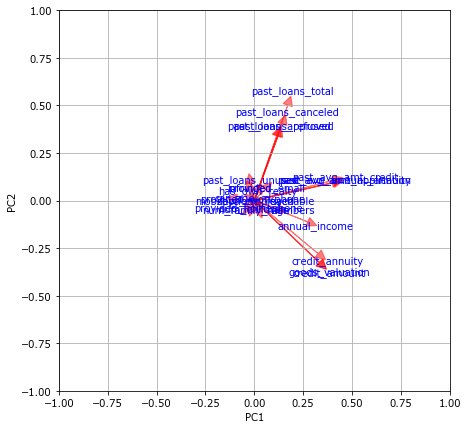

In [78]:
fig, ax = plt.subplots(figsize = (7,7))
loading_plot(pca_m.components_.T, base_m.columns)

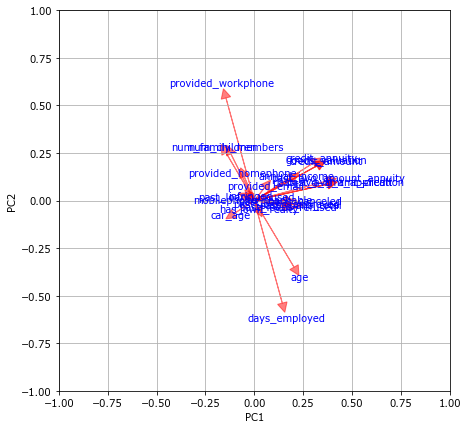

In [79]:
fig, ax = plt.subplots(figsize = (7,7))
loading_plot(pca_f.components_.T, base_f.columns)

### 4.5. Score plot

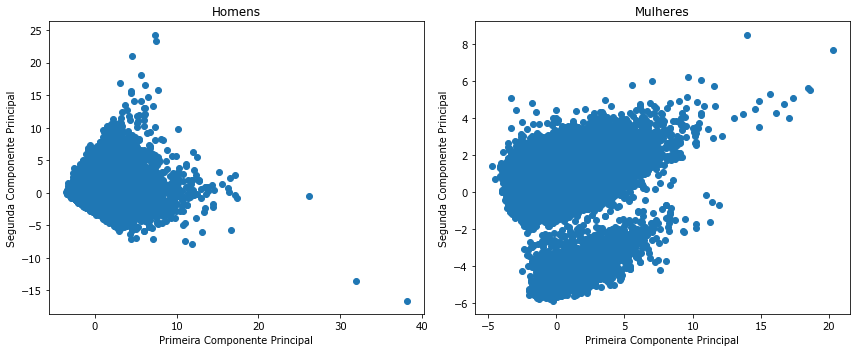

In [80]:
# Create a 1x2 grid of subplots
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

# Scatter plot for the first subplot
axs[0].scatter(base_all_pca_man[:, 0], base_all_pca_man[:, 1])
axs[0].set_xlabel('Primeira Componente Principal')
axs[0].set_ylabel('Segunda Componente Principal')
axs[0].set_title('Homens')

# Scatter plot for the second subplot
axs[1].scatter(base_all_pca_woman[:, 0], base_all_pca_woman[:, 1])
axs[1].set_xlabel('Primeira Componente Principal')
axs[1].set_ylabel('Segunda Componente Principal')
axs[1].set_title('Mulheres')

# Adjust layout
plt.tight_layout()

# Show the plots
plt.show()

Tal como no score plot dos dados todos, conseguimos observar que apenas existe um clusters, havendo alguns outliers com valor de PC1 superior a 3 ou valor de PC2 superior a 2

### 4.6. Análise de resíduos

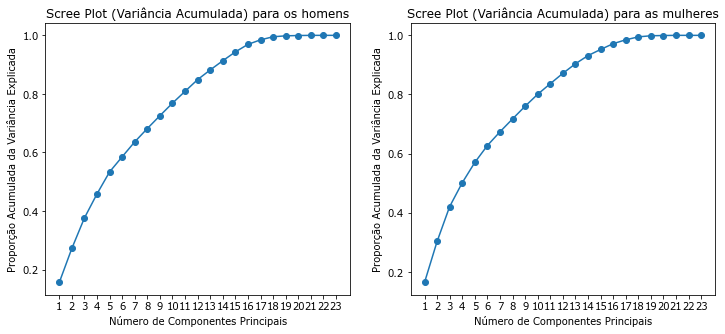

In [81]:
# Calcule os autovalores acumulados
cumulative_eigenvalues_man = np.cumsum(eigenvalues_man)
cumulative_eigenvalues_woman = np.cumsum(eigenvalues_woman)

# Calcule a proporção acumulada da variância explicada
explained_variance_ratio_man = cumulative_eigenvalues_man / np.sum(eigenvalues_man)
explained_variance_ratio_woman = cumulative_eigenvalues_woman / np.sum(eigenvalues_woman)

# Crie o gráfico de Scree Plot com autovalores acumulados
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

axs[0].plot(range(1, len(explained_variance_ratio_man) + 1), explained_variance_ratio_man, marker='o', linestyle='-')
axs[0].set_xticks(np.arange(1, len(explained_variance_ratio_man) + 1, step=1))
axs[0].set_xlabel('Número de Componentes Principais')
axs[0].set_ylabel('Proporção Acumulada da Variância Explicada')
axs[0].set_title('Scree Plot (Variância Acumulada) para os homens')

axs[1].plot(range(1, len(explained_variance_ratio_woman) + 1), explained_variance_ratio_woman, marker='o', linestyle='-')
axs[1].set_xticks(np.arange(1, len(explained_variance_ratio_woman) + 1, step=1))
axs[1].set_xlabel('Número de Componentes Principais')
axs[1].set_ylabel('Proporção Acumulada da Variância Explicada')
axs[1].set_title('Scree Plot (Variância Acumulada) para as mulheres')

plt.show()

In [82]:
reconstructed_matrix_man = pca_m.inverse_transform(base_all_pca_man)
reconstructed_matrix_woman = pca_f.inverse_transform(base_all_pca_woman)

In [83]:
e_man = base_m - reconstructed_matrix_man
e_woman = base_f - reconstructed_matrix_woman

##### Análise por linha

In [84]:
distance_point_man = np.sum(e_man**2, axis=1)
distance_point_woman = np.sum(e_woman**2, axis=1)

print(distance_point_man.shape[0])

55693


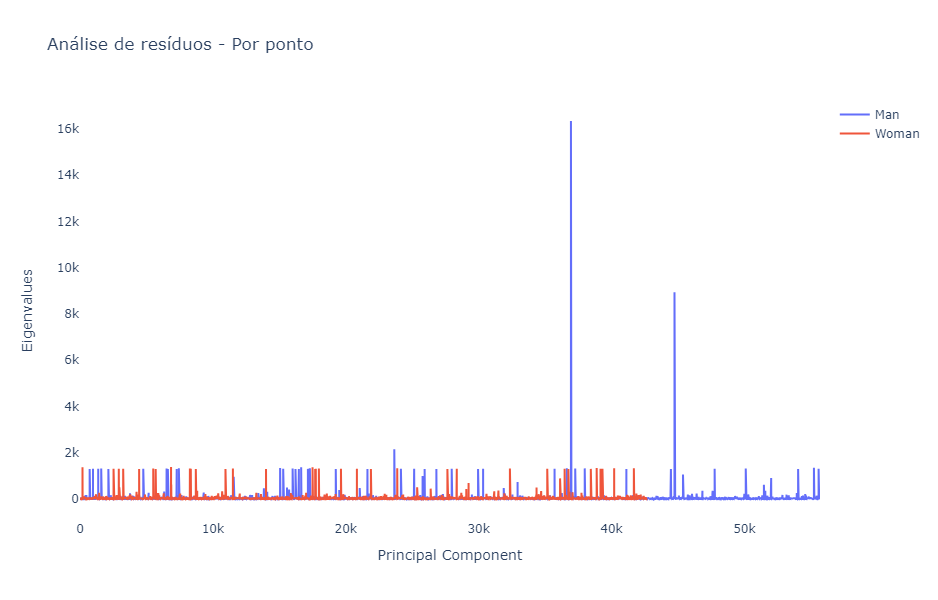

In [85]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=list(range(1,distance_point_man.shape[0]+1)), y=distance_point_man, mode='lines', name='Man'))

fig.add_trace(go.Scatter(x=list(range(1,distance_point_woman.shape[0]+1)), y=distance_point_woman, mode='lines', name='Woman'))

fig.update_layout(plot_bgcolor='rgba(0,0,0,0)')

fig.update_layout(
    title='Análise de resíduos - Por ponto',
    xaxis=dict(title='Principal Component', showgrid=True),
    yaxis=dict(title='Eigenvalues', showgrid=True),
    width=800, 
    height=600)

fig.show()

##### Análise por coluna

In [86]:
variance_col_original_man = variances_per_column = np.var(base_m, axis=0)
variance_col_reconstructed_man = variances_per_column = np.var(reconstructed_matrix_man, axis=0)
variance_col_residue_man = variances_per_column = np.var(e_man, axis=0)

variance_col_original_woman = variances_per_column = np.var(base_f, axis=0)
variance_col_reconstructed_woman = variances_per_column = np.var(reconstructed_matrix_woman, axis=0)
variance_col_residue_woman = variances_per_column = np.var(e_woman, axis=0)

In [87]:
var_explained_feature_man = variance_col_reconstructed_man/variance_col_original_man
var_explained_feature_woman = variance_col_reconstructed_woman/variance_col_original_woman

var_explained_feature_man= var_explained_feature_man.sort_index()
var_explained_feature_woman = var_explained_feature_woman.sort_index()

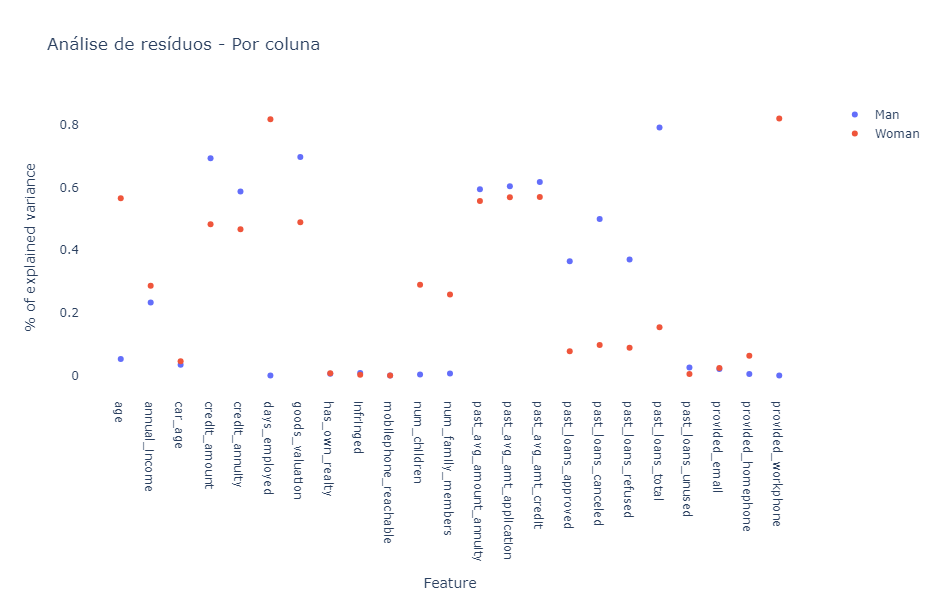

In [88]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=var_explained_feature_man.index, y=var_explained_feature_man, mode='markers', name='Man'))

fig.add_trace(go.Scatter(x=var_explained_feature_woman.index, y=var_explained_feature_woman, mode='markers', name='Woman'))

fig.update_layout(plot_bgcolor='rgba(0,0,0,0)')

fig.update_layout(
    title='Análise de resíduos - Por coluna',
    xaxis=dict(title='Feature', showgrid=True),
    yaxis=dict(title='% of explained variance', showgrid=True),
    width=800, 
    height=600)

fig.show()

In [89]:
#scores_man = np.array([base_all_pca_man[:, 0], base_all_pca_man[:, 1]])
#scores_woman = np.array([base_all_pca_woman[:, 0], base_all_pca_woman[:, 1]])

In [90]:
# Obtenha o número total de pontos
#total_points_man = scores_man.shape[1]
#total_points_woman = scores_woman.shape[1]

# Trabalhando com apenas 1% dos dados, porque são muitos
#num_points_to_select = total_points // 100

# Gere índices aleatórios para selecionar os pontos
#random_indices_man = np.random.choice(total_points_man, size=num_points_to_select, replace=False)
#random_indices_woman = np.random.choice(total_points_woman, size=num_points_to_select, replace=False)

# Selecione os pontos correspondentes aos índices gerados aleatoriamente
#selected_scores_man = scores_man[:, random_indices_man]
#selected_scores_woman = scores_woman[:, random_indices_woman]

In [ ]:
#from scipy.spatial.distance import cdist

#centroid_man = np.mean(selected_scores_man, axis=0)
#centroid_woman = np.mean(selected_scores_woman, axis=0)

#distancias_mahalanobis_man = cdist(selected_scores_man, centroid_man.reshape(1, -1), 'mahalanobis', VI=np.linalg.inv(np.cov(selected_scores_man)))
#distancias_mahalanobis_woman = cdist(selected_scores_woman, centroid_woman.reshape(1, -1), 'mahalanobis', VI=np.linalg.inv(np.cov(selected_scores_woman)))

In [ ]:
#from scipy.spatial import distance

# Calcule as distâncias Mahalanobis dos pontos de dados aos centroides
#centroid_man = np.mean(selected_scores_man, axis=0)
#centroid_woman = np.mean(selected_scores_woman, axis=0)

#DModX_man = [distance.mahalanobis(point, centroid_man, np.cov(selected_scores_man.T)) for point in selected_scores_man]
#DModX_woman = [distance.mahalanobis(point, centroid_woman, np.cov(selected_scores_woman.T)) for point in selected_scores_woman]

# Plote o gráfico DModX

#fig, axs = plt.subplots(1, 2, figsize=(12, 5))

#axs[0].scatter(range(len(DModX_man)), DModX_man, c='b', label='DModX', marker='o')
#axs[0].set_xlabel('Observações')
#axs[0].set_ylabel('Distância Mahalanobis')
#axs[0].legend()
#axs[0].set_title('Gráfico DModX para homens')

#axs[1].scatter(range(len(DModX_woman)), DModX_woman, c='b', label='DModX', marker='o')
#axs[1].set_xlabel('Observações')
#axs[1].set_ylabel('Distância Mahalanobis')
#axs[1].legend()
#axs[1].set_title('Gráfico DModX para mulheres')

#plt.show()

In [ ]:
#distancias_mahalanobis_man = [2.5, 1.8, 3.2, 0.7, 4.0]  # Substitua pelos seus próprios valores
#distancias_mahalanobis_woman = [2.5, 1.8, 3.2, 0.7, 4.0]  # Substitua pelos seus próprios valores

# Defina um limiar de detecção (opcional)
#limiar = 2.0

#fig, axs = plt.subplots(1, 2, figsize=(12, 5))

# Crie um gráfico de barras das distâncias Mahalanobis
#axs[0].bar(range(len(distancias_mahalanobis_man)), distancias_mahalanobis_man, color='b', label='Distâncias Mahalanobis')
#axs[0].axhline(y=limiar, color='r', linestyle='--', label='Limiar de Detecção')
#axs[0].set_xlabel('Observações')
#axs[0].set_ylabel('Distâncias Mahalanobis')
#axs[0].legend()
#axs[0].set_title('Gráfico DModX (Barras)')

#axs[1].bar(range(len(distancias_mahalanobis_woman)), distancias_mahalanobis_woman, color='b', label='Distâncias Mahalanobis')
#axs[1].axhline(y=limiar, color='r', linestyle='--', label='Limiar de Detecção')
#axs[1].set_xlabel('Observações')
#axs[1].set_ylabel('Distâncias Mahalanobis')
#axs[1].legend()
#axs[1].set_title('Gráfico DModX (Barras)')

#plt.show()